# Měření velikosti zahřívané součástky
Tento úkol je zaměřen na využití kombinace dat z obyčejné RGB kamery a termokamery. Jako zahřívaná součástka bylo využito zařízení **Raspberry Pi 2 (Model B)** společně s **parazitními 2A rezistory** připojeny v USB.

Úkol má za cíl oživit dovednosti studentů při práci s obrazem, jakými jsou například projektivní transformace, segmentace nejen v barevných kanálech nebo měření velikostí v reálných jednotkách.

![](images/vv.png)

### Import knihoven a konfigurace

In [515]:
import os
import io

import cv2
import numpy as np
import matplotlib.pyplot as plt

from improutils import *
from scipy.spatial import distance

%matplotlib inline
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

### Pomocné funkce
Seznamte se, lze využít. Ostatní již známé funkce jsou v [improutils](https://gitlab.fit.cvut.cz/bi-svz/improutils_package).

In [516]:
def normalized_image(img):
    # Dejte si pozor, že cv2.normalize nalezne minimální/maximální hodnotu v obraze vůči kterým normalizuje a tento vstup nelze změnit.
    # Můžeme pouze nastavit nové minimum a maximum. Později v úkolu budete muset napsat svoji "chytřejší" normalizaci.
    scaled = np.zeros_like(img)
    cv2.normalize(img, scaled, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    return scaled.astype('uint8')

def to_3_channels(image_one_channel):
    '''
    Převede jednokanálový obrázek na tříkanálový. 
    Cílem je například přidat možnost do černobílého obrázku něco kreslit nebo spojovat více 3kanálových obrázků.
    '''
    h,w = image_one_channel.shape
    image3 = np.zeros((h,w,3), dtype=np.uint8)
    image3[:,:,0] = image_one_channel
    image3[:,:,1] = image_one_channel
    image3[:,:,2] = image_one_channel
    return image3

def load_termo_csv(file_path):
    '''
    Načtení dat z textového souboru do numpy matice. Textová data jsou oddělena pomocí znaku středník (;).
    '''
    return np.genfromtxt(file_path, delimiter=';')[:, :-1]

---

## Úkol
K obrazové práci nad zahřívanou součástky jsou k dispozici nasnímaná data z rgb kamery a data reálných teplot z termokamery. Oboje je dostupné ve složce `data/`.

Za úkol je možné získat až **8 bodů** a až **2 prémiové**.

### 1) Načtěte data
Načtěte obrazová data ve formátu `png` a data teplot ve formátu `csv`. Data teplot obsahují reálné hodnoty teplot v jednotkách **°C** s přesností na desetinu stupně. Vhodně zobrazte jak data **obrazová**, tak data **teplot** obrázkem.

<div style="color: blue; text-align: right">[ 0,5 bodu ]</div>

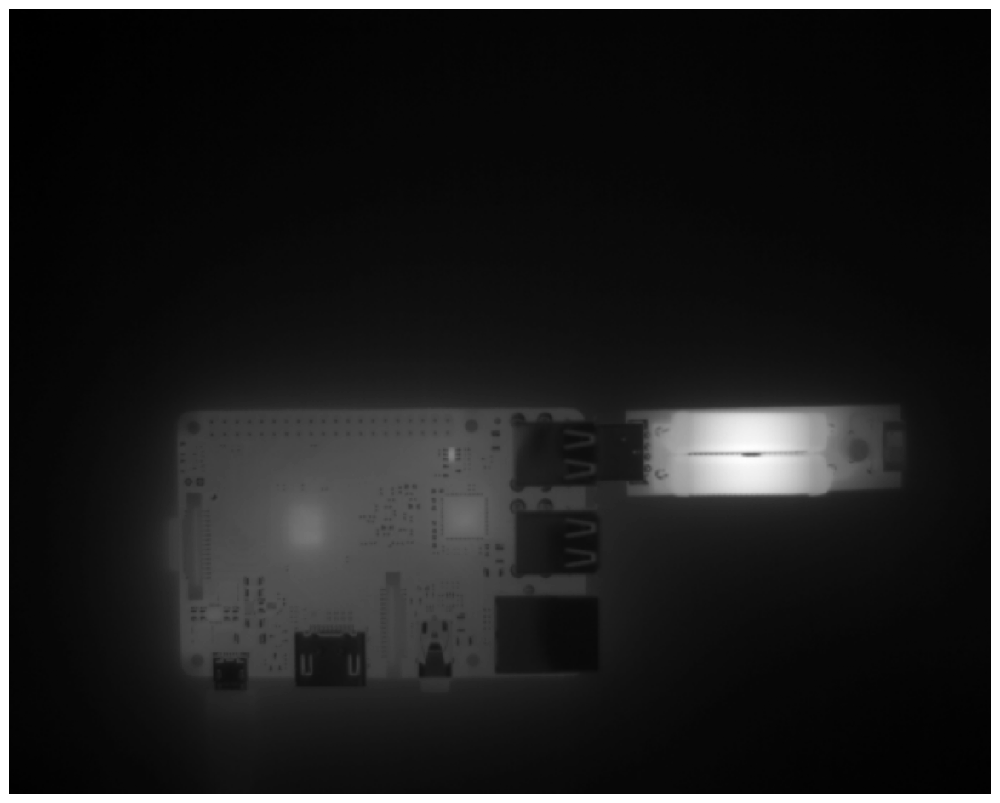

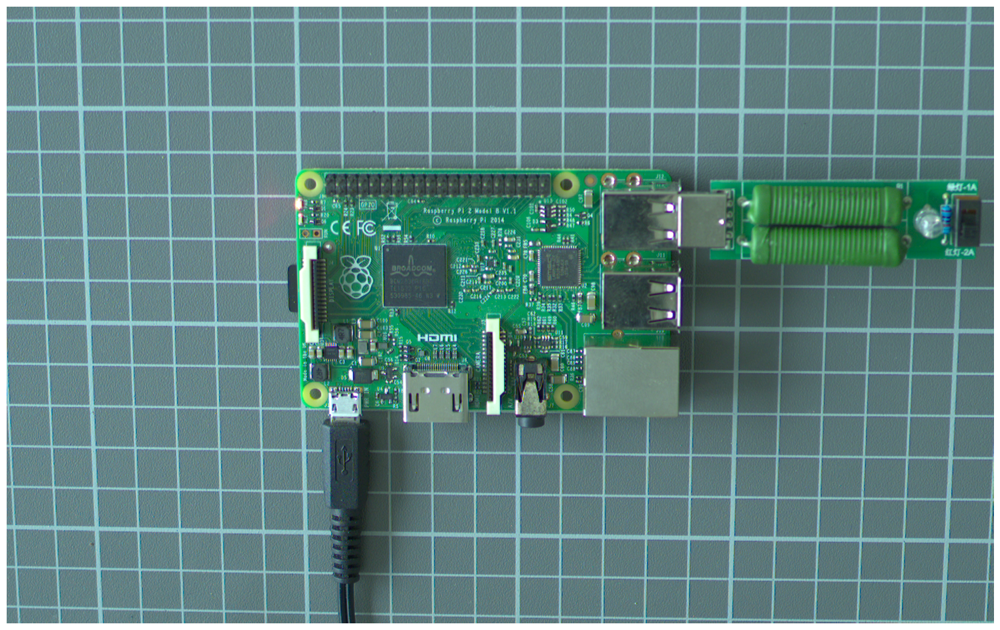

In [517]:
image = load_image('data/data_rgb.png')
data = load_termo_csv('data/data_temps.csv')
thermal = normalized_image(data)

plot_images(thermal)
plot_images(image)

### 2) Vypište hodnoty několika teplot
Zvolte v obraze **3 body** a vypište hodnoty teploty v těchto bodech. Snažte se najít místa s **nejvyššími** teplotami.

<div style="color: blue; text-align: right">[ 0,5 bodu ]</div>

In [518]:
cv2.imwrite('thermal.jpg', thermal)

True

Pomocí GUI nástroje Gimp jsem vybral tyto tři body:
- Jedná se o pozici dvou mikročipů a rezistorů

In [519]:
x1 = [483, 305] # Rezistor
x2 = [288, 290] # Mini-čip
x3 = [192, 336] # Velký čip

In [520]:
print(f'{data[x1[1],x1[0]]} °C')
print(f'{data[x2[1],x2[0]]} °C')
print(f'{data[x3[1],x3[0]]} °C')

65.4 °C
48.9 °C
45.9 °C


### 3) Namapujte termosnímek na RGB
Uvědomte si, že snímky **nejsou stejně velké** ani foceny ze **stejného úhlu**. Pamatujte, že je **důležité** uvědomit si **správně rovinu**, ve které pracujeme. Zobrazte jak obrázek RGB, tak namapovaný termosnímek.

Klíčová slova:
- přiřazení dvojic bodů
- hledání transformační matice
- warpování termosnímku na perspektivu RGB

<div style="color: blue; text-align: right">[ 1,5 bodu ]</div>

- Jakožto odpovídající dvojice bodů jsem vybral rohy Raspberry desky a rohy u desky rezistorů

In [521]:
imagePtsThermal = np.array([[124,425], [303,425], [303, 272], [120,272], [403,317], [580,312], [580,259], [403,263]])
imagePtsRgb = np.array([[597,755], [1089,756], [1089,347], [590,345], [1370,491], [1881,491], [1887,339], [1370,339]])

In [522]:
H,_ = cv2.findHomography(imagePtsThermal, imagePtsRgb)
print(H)

[[2.668 0.046 258.497]
 [0.037 2.705 -394.696]
 [-0.000 0.000 1.000]]


In [523]:
heightRgb, widthRgb, channels = image.shape

thermalWarped = cv2.warpPerspective(thermal, H, (widthRgb, heightRgb))
dataWarped = cv2.warpPerspective(data, H, (widthRgb, heightRgb))

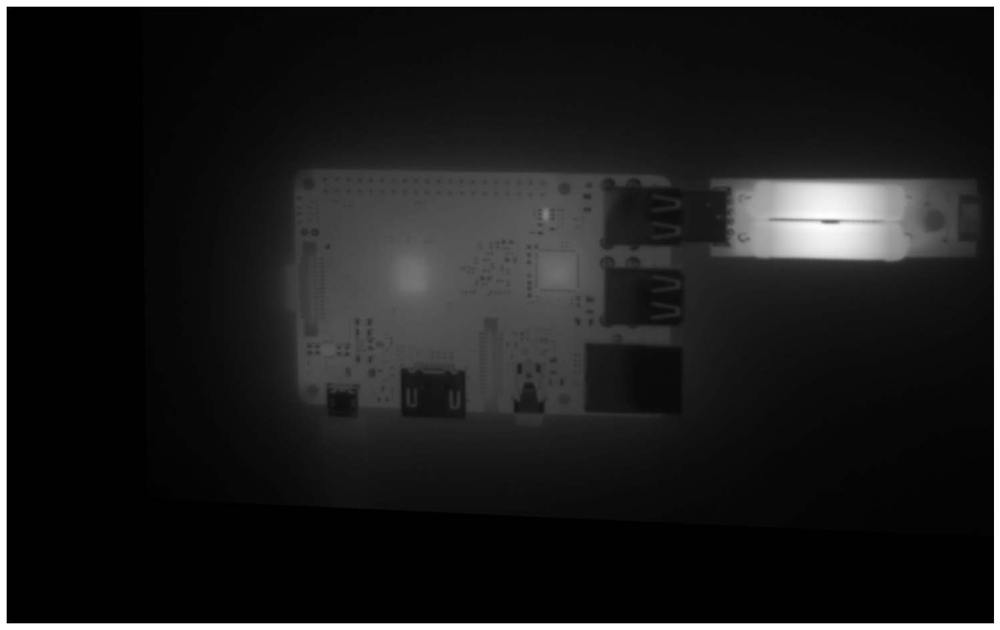

In [524]:
plot_images(thermalWarped)

### 4) Segmentujte v termosnímku
Pomocí rozsahu **reálných teplot** (ne jasových hodnot) vytvořte binární masku, která bude obsahovat **celé Raspberry Pi** bez připojených USB rezistorů. Masku zobrazte.

<div style="color: blue; text-align: right">[ 1,5 bodu ]</div>

In [525]:
from ipywidgets import interact, IntSlider

def adjustThresholds(lower, upper):
    mask = segmentation_two_thresholds(dataWarped, lower, upper)
    plt.figure(figsize=(20, 10))
    plt.imshow(mask, cmap='gray')
    plt.axis('off')
    plt.show()

interact(adjustThresholds,
         lower=IntSlider(min=0, max=255, value=20, description='Lower Threshold'),
         upper=IntSlider(min=0, max=255, value=220, description='Upper Threshold'));

interactive(children=(IntSlider(value=20, description='Lower Threshold', max=255), IntSlider(value=220, descri…

In [526]:
mask = segmentation_two_thresholds(dataWarped, 36, 68)

In [527]:
masked, contours, cnt = find_contours(mask, 80000, 1000000)

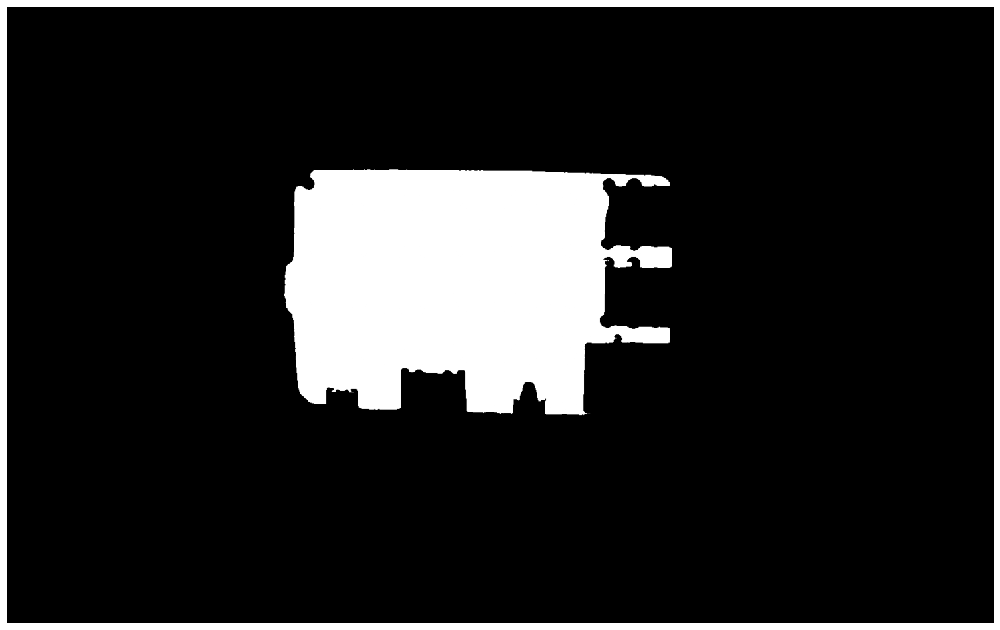

In [528]:
plot_images(masked)

In [529]:
kernel = np.ones((7, 7),np.uint8)

closing = cv2.morphologyEx(masked, cv2.MORPH_CLOSE, kernel, iterations=3)

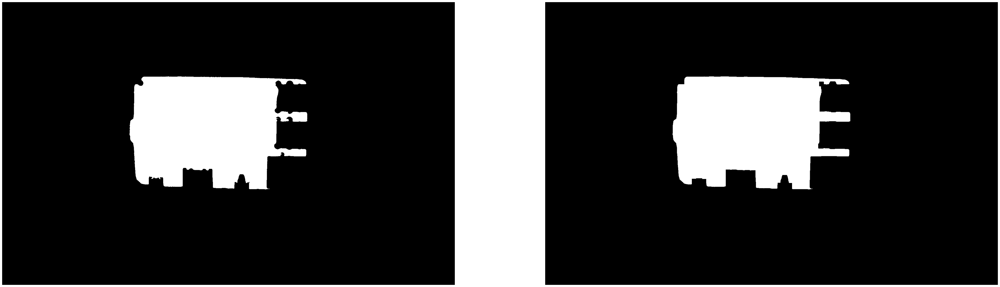

In [530]:
plot_images(masked, closing)

### 5) Aplikujte data teplot na RGB obraz
Pomocí výše vytvořené **binární masky** segmentujte **data teplot**. Ty následně zobrazte pomocí vybrané [JET colormapy](https://docs.opencv.org/3.2.0/d3/d50/group__imgproc__colormap.html). Jako dílčí výstup **vytvořte funkci** pro **min-max normalizaci** teplotních hodnot obrazu, která přímá na vstupu **min, max, newmin, newmax**. Bude se hodit při aplikaci colormapy. Dále se vám může hodit funkce `to_3_channels()` k snadnějším bitovým operacím. Její využití však není podmínkou, způsobů získání výsledku je více.

Snímek by měl vypadat následovně (nenechte se zmást zobrazením BGR $\leftrightarrow$ RGB při používání matplotlibu).

![](images/fuse.png)

Klíčová slova:
- min-max normalizace
- aplikace colormapy
- segmentace pomocí masky
- vážené spojení dvou obrazů

<div style="color: blue; text-align: right">[ 1,5 bodu ]</div>

In [531]:
def min_max_norm(image, oldMin, oldMax, newMin, newMax):
    # Zamezení dělení nulou
    if oldMax - oldMin == 0:
        return np.full_like(image, newMin, dtype=np.float32)
    
    normalized = (image - oldMin) / (oldMax - oldMin)
    normalized = normalized * (newMax - newMin) + newMin
    return normalized

In [532]:
segmentedData = np.zeros_like(dataWarped)
segmentedData[closing > 0] = dataWarped[closing > 0]

In [533]:
validPixels = segmentedData[segmentedData > 0]
oldMin = np.min(validPixels)
oldMax = np.max(validPixels)

normalizedData = min_max_norm(segmentedData, oldMin, oldMax, 0, 255).astype(np.uint8)

Aplikujeme JET colormapu na normalizovaná data

In [534]:
thermalColor = cv2.applyColorMap(normalizedData, cv2.COLORMAP_JET).astype(np.uint8)

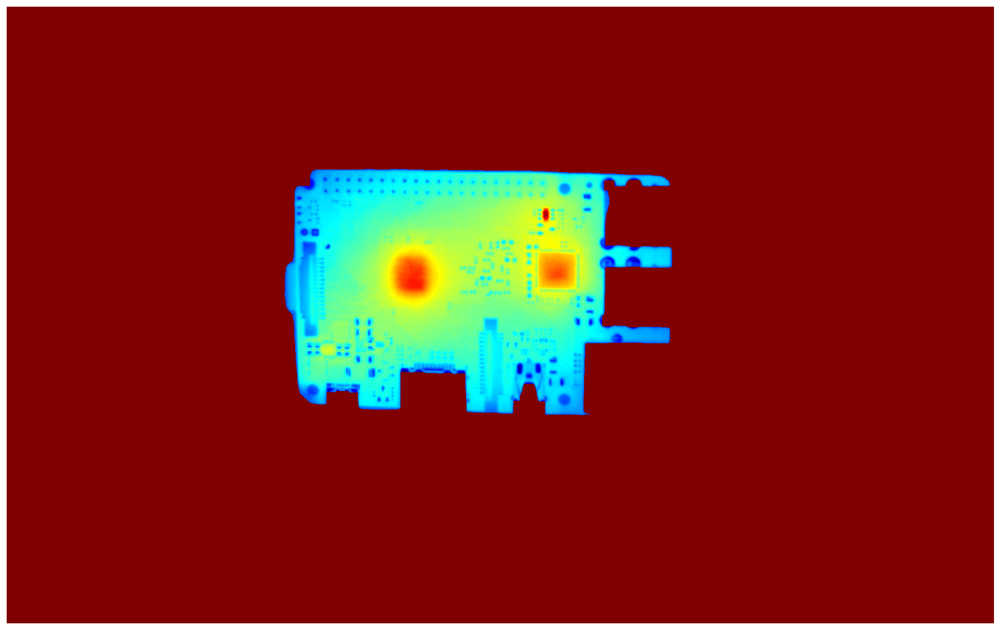

In [535]:
plot_images(thermalColor)

Provedeme vážené spojení dvou obrazů

In [543]:
# Vytvoříme overlay
overlay = cv2.addWeighted(image, 0.3, thermalColor, 0.7, 0)

# Omezíme overlay pouze na oblast Raspberry Pi
finalImage = image.copy()
finalImage[closing > 0] = overlay[closing > 0]

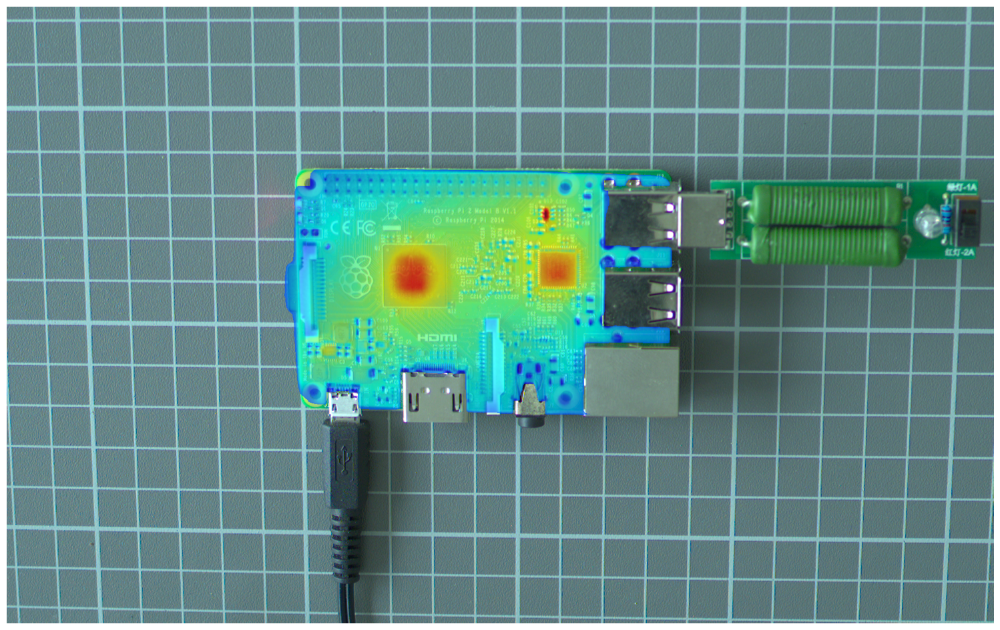

In [544]:
plot_images(finalImage)

### 6) Segmentujte součástky
Využijte teplotní data k segmentaci **pouze 2 zahřívajících se** součástek - mikročipů. Zajímá nás plocha, která má teplotu vyšší než **43 °C**.

Při jejich hledání **využijte** informaci, že hledané mikročipy mají přibližně tvar čtverce.

<div style="color: blue; text-align: right">[ 1,5 bodu ]</div>

Nejprve vyfiltrujeme plochu, která má teplotu vyšší než 43 °C

In [545]:
thresholdTemp = 44
maskChips = (dataWarped > thresholdTemp).astype(np.uint8) * 255

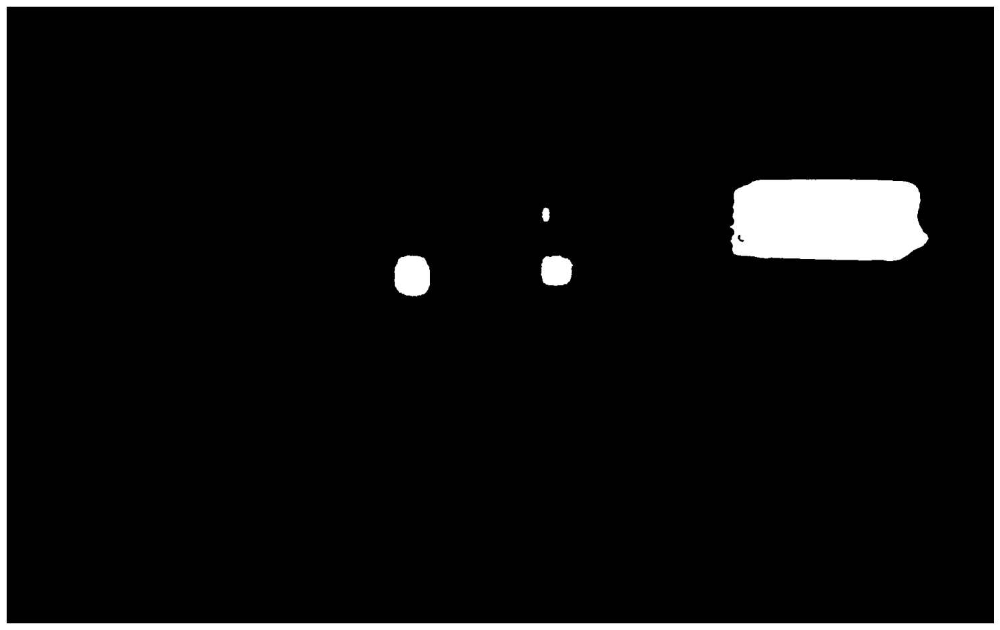

In [546]:
plot_images(maskChips)

Pomocí findContours vyfiltrujeme pouze kontury vhodné velikosti (odpovídající mikročipům)

In [547]:
masked, cnt, contours = find_contours(maskChips, 1000, 10000)

Mikročipy se mi podařilo vysegmentovat již v tomto kroku, proto nebudeme provádět aproximaci pomocí čtverce

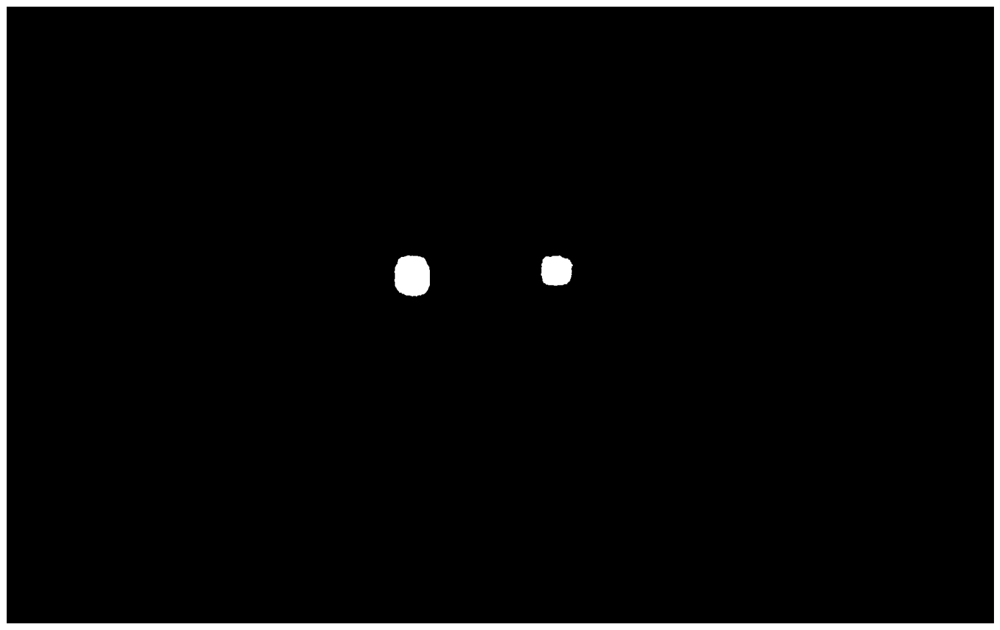

In [548]:
plot_images(masked)

### 7) Zjistěte velikost mikročipů v reálných jednotkách
Zjistěte pro každý mikročip, jak velká je celková zahřívaná plocha v cm$^2$, mající vyšší teplotu než je pro nás kritických **43 °C**. Pro přechod z pixelů do reálných jednotek jsme důkladně cvičili 2 různé způsoby. V tomto případě, je ale jeden z nich správnější, než ten druhý. Vyberte, který chcete, o absolutní přesnost zde v tuhle chvíli nejde. Disktutujte však správnost vybraného postupu.

**HINT -** Perspektiva.

<div style="color: blue; text-align: right">[ 1 bod ]</div>

Pokud použijeme nejprve homografii k "narovnání" obrazu,
získáme nezakřivený pohled, ve kterém lze s větší mírou jistoty prohlásit, že jeden pixel odpovídá
stejné délkové jednotce všude v dané oblasti. Tím bude měření plochy mikročipů mnohem přesnější.

In [549]:
imagePts = np.array([
    [554, 318],
    [1295, 320],
    [1284, 794],
    [575, 783]
])

# Použil jsem známe rozměry desky v mm u modelu Raspberry pi 2 model B, jak je uvedeno v úvodu úkolu
realWidth = 85.6
realHeight = 56.5

worldPts = np.array([
    [0, 0],
    [realWidth, 0],
    [realWidth, realHeight],
    [0, realHeight]
])

In [550]:
H, _ = cv2.findHomography(imagePts, worldPts)

In [553]:
for cnt in contours:
    # Transformace kontury pomocí homografie
    cntTransformed = cv2.perspectiveTransform(cnt.astype(np.float32), H)

    # Výpočet plochy v mm2
    areaCm2 = cv2.contourArea(cntTransformed)

    # Převod a zobrazení v cm2
    print(f"Zahřívaná plocha čipu: {areaCm2/100:.2f} cm²")

Zahřívaná plocha čipu: 0.41 cm²
Zahřívaná plocha čipu: 0.65 cm²


---

### 8) Prémium #1
Nabízím 1 prémiový bod za detekci středů kružnic v RGB i v termo automatizovaně pomocí algoritmů. Například pomocí Houghovy transformace nebo i třeba hranové detekce + tvarových charakteristik. Jde primárně o díry na šrouby, které lze využít k hledání korespondenčních bodů a následné aplikaci perspektivní transformace.

### 9) Prémium #2
Nabízím 1 prémiový bod za výpočet plochy v cm$^2$ obou mikročipů v RGB obraze. Následně je nutné výsledky dát do poměru s vypočtenou plochou z termo snímku, která se zahřívala nad kritických 43° C. Tím lze například porovnat, který z nich se více zahřívá.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=cb96ed8f-8ccb-4e75-aa03-5c9798c13a08' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>

### Prémium #1

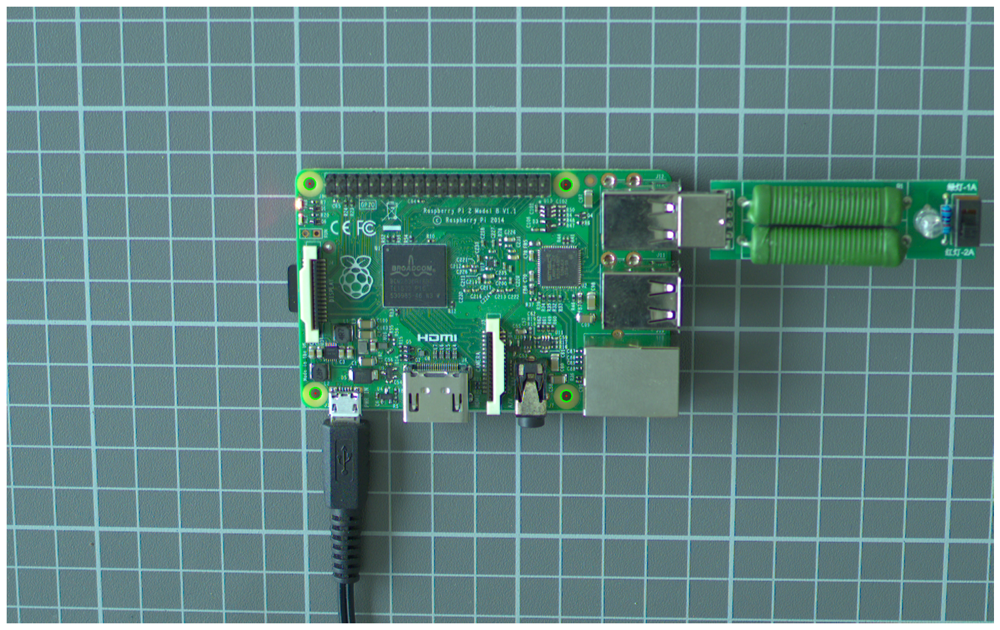

In [554]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Vyhlazení obrazu pomocí Gaussovského filtru
gray = cv2.GaussianBlur(gray, (5,5), 0)

# Detekce hran v obraze pomocí Cannyho algoritmu
edges = cv2.Canny(gray, 100, 200)

_, cnt, contours = find_contours(edges, 100,100000)

filteredContours = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)
    if perimeter == 0:
        continue

    # Kružnice by měla kruhovitost 1, nižší hodnoty značí méně kruhové tvary
    circularity = (4 * np.pi * area) / (perimeter * perimeter)

    # Uvažujme určitou toleranci
    if circularity > 0.85:
        filteredContours.append(cnt)

finalContours = []
for cnt in filtered_contours:
    (x, y), radius = cv2.minEnclosingCircle(cnt)

    # Filtrujeme podle poloměru - chceme najít díry pro šrouby
    if 11 < radius < 20:
        finalContours.append(cnt)

result = image.copy()
for cnt in final_contours:
    (x, y), radius = cv2.minEnclosingCircle(cnt)
    center = (int(x), int(y))
    radius = int(radius)
    cv2.circle(result, center, radius, (0,255,0), 2)
    cv2.circle(result, center, 2, (0,0,255), -1)

plot_images(result)

### Prémium #2

Nejprve segmentujeme z obrazu mikročipy

In [555]:
cropped = crop(image, 500,300,1400,850)

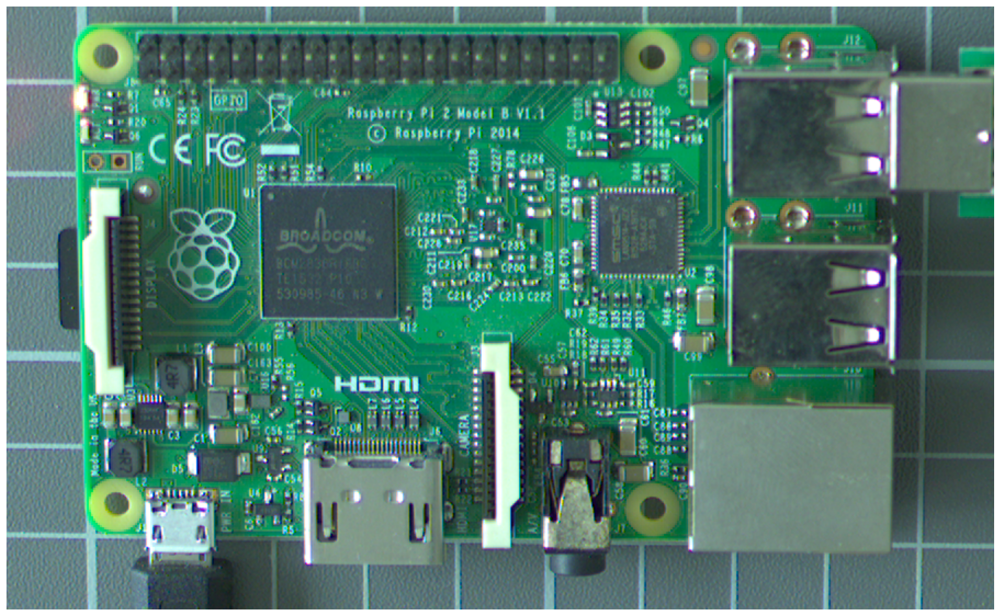

In [556]:
plot_images(cropped)

In [557]:
hsvImg = cv2.cvtColor(cropped, cv2.COLOR_BGR2HSV)

In [330]:
from ipywidgets import interact, IntRangeSlider
%matplotlib inline


def createSlider(min=0, max=255, description=''):
    return IntRangeSlider(
        value=(min, max),
        min=min,
        max=max,
        step=1,
        description=description,
        continuous_update=True
    )


@interact(hRange=createSlider(min=0, max=360, description='Hue:'),
          sRange=createSlider(min=0, max=255, description='Saturation:'),
          vRange=createSlider(min=0, max=255, description='Value:'))
def _(hRange, sRange, vRange):

    lower = (to_intensity(hRange[0]), sRange[0], vRange[0])
    upper = (to_intensity(hRange[1]), sRange[1], vRange[1])
    
    mask = segmentation_two_thresholds(hsvImg, lower, upper)
    
    plt.figure(figsize=(20, 10))
    plt.imshow(mask)
    plt.imshow(apply_mask(hsvImg, mask))
    plt.axis('off')
    plt.show()


interactive(children=(IntRangeSlider(value=(0, 360), description='Hue:', max=360), IntRangeSlider(value=(0, 25…

In [558]:
lower = (to_intensity(142), 34, 78)
upper = (to_intensity(256), 122, 113)

mask = segmentation_two_thresholds(hsvImg, lower, upper)
result = apply_mask(hsvImg, mask)

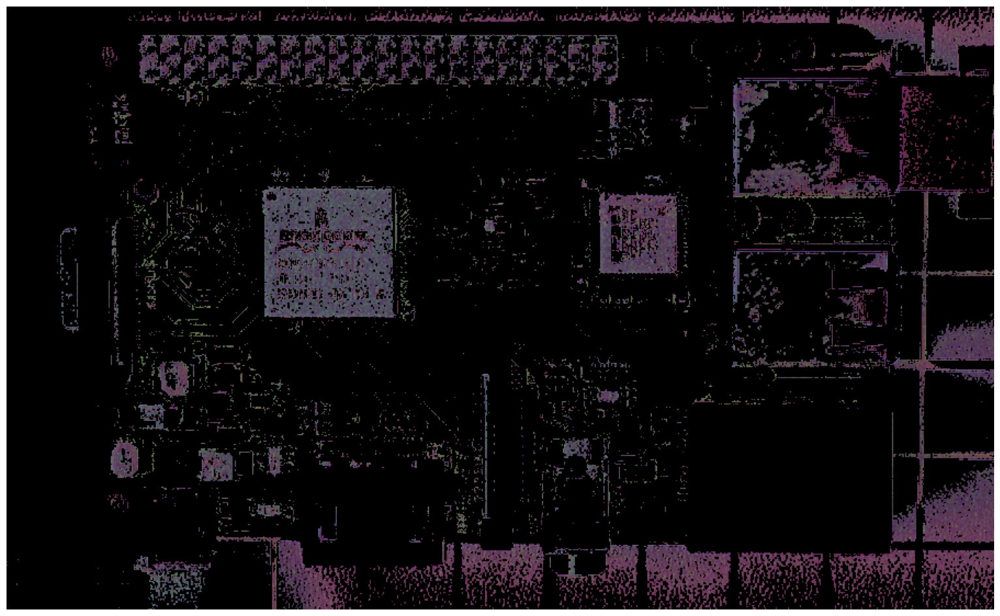

In [559]:
plot_images(result)

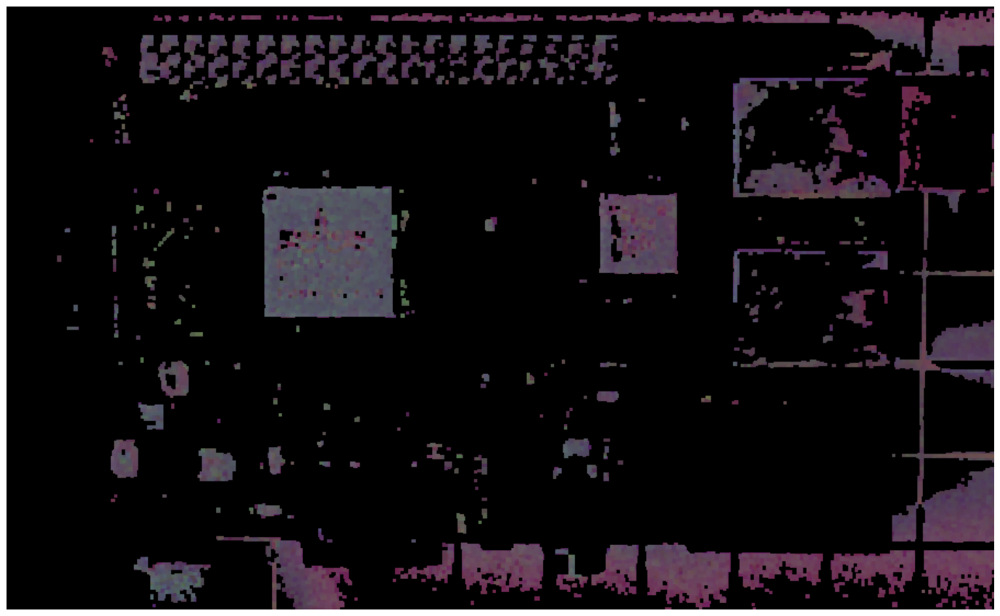

In [560]:
kernel = np.ones((3,3),np.uint8)
closing = cv2.morphologyEx(result, cv2.MORPH_CLOSE, kernel)
kernel2 = np.ones((7,7),np.uint8)
opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel, iterations=1)
plot_images(opening)

In [561]:
gray = cv2.cvtColor(opening, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, (5,5), 0)
edges = cv2.Canny(gray, 150, 305)

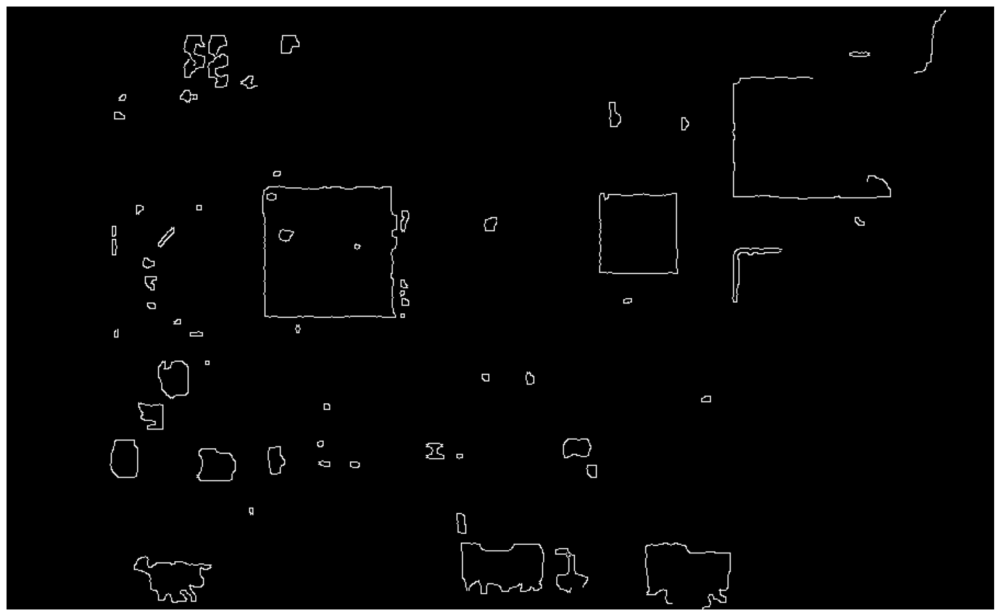

In [562]:
plot_images(edges)

In [563]:
draw,cnt,contours = find_contours(edges, 2500, 20000)

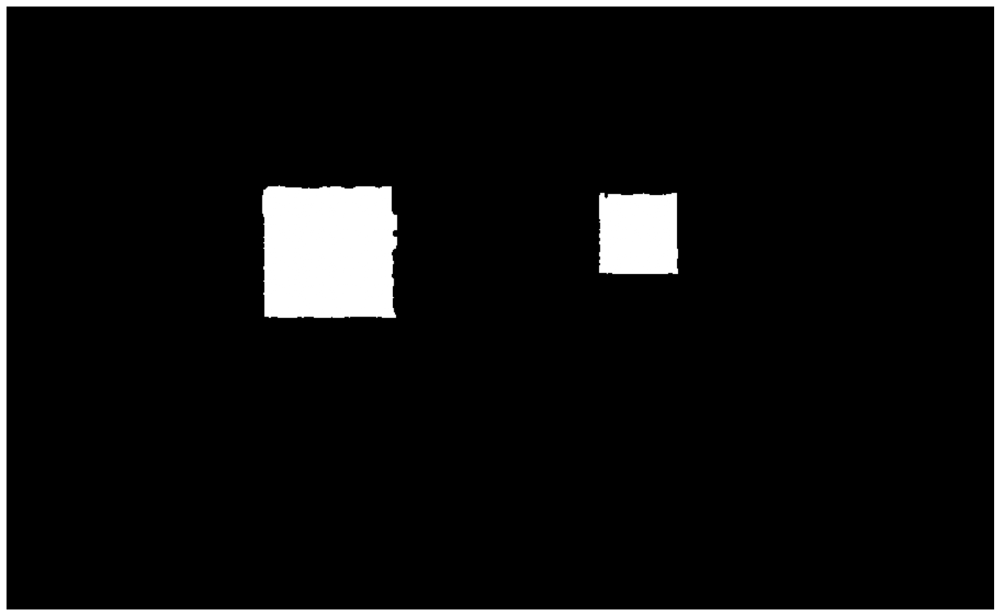

In [564]:
plot_images(draw)

In [565]:
print(cnt)

2


Vypočítáme plochu mikročipů podobně jako v případě výpočtu zahřívané oblasti

In [571]:
for cnt in contours:
    # Transformace kontury pomocí homografie
    cntTransformed = cv2.perspectiveTransform(cnt.astype(np.float32), H)

    # Výpočet plochy v mm2
    areaCm2 = cv2.contourArea(cntTransformed)

    # Přepočet plochy na cm2
    print(f"Celková plocha čipu: {areaCm2/100:.2f} cm²")

Celková plocha čipu: 0.66 cm²
Celková plocha čipu: 1.88 cm²


In [572]:
chip1Ratio = 0.41 / 0.66
chip2Ratio = 0.65 / 1.88

print("Podíl zahřáté plochy prvního čipu:", round(chip1Ratio*100, 2), "%")
print("Podíl zahřáté plochy druhého čipu:", round(chip2Ratio*100, 2), "%")

Podíl zahřáté plochy prvního čipu: 62.12 %
Podíl zahřáté plochy druhého čipu: 34.57 %
